# Zadanie 19.3

Pozostaw zbiór testowy jak obecnie. Zmień funkcję do backtestów oraz stworzenia zbiorów treningowego oraz testowego, tak aby nie ucinało pierwszych wartości ze zbioru testowego. Ze zbioru treningowego wyciągnij zbiór walidacyjny. Stwórz coś na wzór ‘siatki hiperparametrów’, tak jak dzieje się w GridSearch (Podpowiedź: Wystarczą pętle). Jako hiperparametry traktuj wartość dla zmiennej look_back oraz liczbę komórek w warstwie (units). Sprawdź zatem wszystkie architektury dla look_back z zakresu od 1 do 12 oraz units z zakresu 1 do 12. Wybierz model, który ma najniższą metrykę RMSE na zbiorze walidacyjnym i zwizualizuj prognozę vs wartości prawdziwe.

In [1]:
# przetwarzanie danych
import numpy as np
import pandas as pd

# przekształcanie – normalizacja danych
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# wizualizacja
import matplotlib.pyplot as plt

# sieci neuronowe
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import LSTM
from keras.layers import GRU

# ewaluacja modelu
from sklearn.metrics import root_mean_squared_error

In [2]:
dataset = pd.read_csv('airline-passengers.csv')
dataset['Month'] = pd.to_datetime(dataset['Month'])
dataset.set_index(['Month'], inplace=True)

In [3]:
data = dataset['Passengers'].values.astype('float32').reshape(-1, 1)

In [4]:
n = len(data)
train_val_size = int(n * 0.7)
test_size = n - train_val_size

In [5]:
def create_sequences(array, look_back=1):
    """
    Zwraca krotkę (X, y), gdzie X ma kształt (N, look_back),
    a y ma kształt (N,).
    """
    X, y = [], []
    for i in range(len(array) - look_back):
        X.append(array[i : i + look_back, 0])
        y.append(array[i + look_back, 0])
    return np.array(X), np.array(y)

In [6]:
def prepare_data(data, look_back=3, val_ratio=0.2):
    """
    1) Dzieli dane na:
       - train + val (pierwsze 70% danych)
       - test (ostatnie 30% danych)
    2) Z wydzielonego train+val dzieli jeszcze na train i val
    3) Nie ucina początkowych wartości w test poprzez
       dołączenie 'look_back' z końca części treningowej.
    4) Zwraca (X_train, y_train), (X_val, y_val), (X_test, y_test) i scaler.
    """
    # Ustalamy indeks podziału
    train_val_size = int(len(data) * 0.7)
    
    # Dane do trenowania+walidacji
    train_val_data = data[:train_val_size]
    # Dane do testu (uwzględniamy overlap look_back)
    test_data = data[train_val_size - look_back:]  # żeby nie ucinać sekwencji
    
    # Dzielimy train_val na train i val
    val_size = int(len(train_val_data) * val_ratio)
    train_data = train_val_data[:-val_size]
    val_data = train_val_data[-val_size:]
    
    # Skalowanie danych na podstawie zbioru treningowego
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaler.fit(train_data)
    
    train_data_scaled = scaler.transform(train_data)
    val_data_scaled = scaler.transform(val_data)
    test_data_scaled = scaler.transform(test_data)
    
    # Tworzenie sekwencji dla train, val
    X_train, y_train = create_sequences(train_data_scaled, look_back=look_back)
    X_val, y_val = create_sequences(val_data_scaled, look_back=look_back)
    
    # Tworzenie sekwencji dla test
    X_test_full, y_test_full = create_sequences(test_data_scaled, look_back=look_back)

    excess = len(y_test_full) - test_size
    if excess > 0:
        X_test_full = X_test_full[excess:]
        y_test_full = y_test_full[excess:]
    
    # Reshape do (samples, 1, look_back), bo Keras RNN oczekuje (N, timesteps, features)
    X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
    X_val = np.reshape(X_val, (X_val.shape[0], 1, X_val.shape[1]))
    X_test = np.reshape(X_test_full, (X_test_full.shape[0], 1, X_test_full.shape[1]))
    
    return (X_train, y_train), (X_val, y_val), (X_test, y_test_full), scaler

In [7]:
def build_model(net_type, units, look_back):
    """
    Buduje i zwraca zkompilowany model typu net_type: ['RNN', 'LSTM', 'GRU'].
    :param net_type: 'RNN', 'LSTM' albo 'GRU'
    :param units: liczba jednostek (neurony/komórki pamięci) w warstwie rekurencyjnej
    :param look_back: liczba kroków wstecz (sekwencji wejściowej)
    """
    model = Sequential()
    if net_type == 'RNN':
        model.add(SimpleRNN(units, input_shape=(1, look_back)))
    elif net_type == 'LSTM':
        model.add(LSTM(units, input_shape=(1, look_back)))
    elif net_type == 'GRU':
        model.add(GRU(units, input_shape=(1, look_back)))
    else:
        raise ValueError("Nieobsługiwany typ sieci: wybierz 'RNN', 'LSTM' lub 'GRU'.")
    
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

In [8]:
net_types = ['RNN', 'LSTM', 'GRU']
look_back_values = range(1, 13)
units_values = range(1, 13)

best_rmse = np.inf
best_config = None
best_model = None
best_scaler = None

# Przygotowujemy parametry
epochs = 200
batch = 1
valsize = 0.2

for net_type in net_types:
    for look_back in look_back_values:
        for units in units_values:
            # Przygotowanie danych z aktualnym look_back
            (X_train, y_train), (X_val, y_val), (X_test, y_test), scaler = \
                prepare_data(data, look_back=look_back, val_ratio=valsize)
            
            # Budujemy i trenujemy model
            model = build_model(net_type, units, look_back)
            history = model.fit(
                X_train, y_train,
                validation_data=(X_val, y_val),
                epochs=epochs,
                batch_size=batch,
                verbose=1
            )
            
            # Obliczamy RMSE na walidacji
            y_val_pred = model.predict(X_val)
            
            # Inwersja skalowania
            y_val_true_unscaled = scaler.inverse_transform(y_val.reshape(-1, 1))
            y_val_pred_unscaled = scaler.inverse_transform(y_val_pred)
            
            rmse_val = root_mean_squared_error(y_val_true_unscaled, y_val_pred_unscaled)
            
            # Sprawdzamy, czy to najlepszy model
            if rmse_val < best_rmse:
                best_rmse = rmse_val
                best_config = (net_type, look_back, units, rmse_val)
                best_model = model
                best_scaler = scaler

print("Najlepszy model:")
print("  Typ sieci  :", best_config[0])
print("  look_back  :", best_config[1])
print("  units      :", best_config[2])
print("  RMSE (val) :", best_config[3])

Epoch 1/200
79/79 [==============================] - 1s 5ms/step - loss: 0.1578 - val_loss: 0.6385
Epoch 2/200
79/79 [==============================] - 0s 2ms/step - loss: 0.1049 - val_loss: 0.5056
Epoch 3/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0736 - val_loss: 0.4006
Epoch 4/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0566 - val_loss: 0.3325
Epoch 5/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0491 - val_loss: 0.2808
Epoch 6/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0461 - val_loss: 0.2525
Epoch 7/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0444 - val_loss: 0.2391
Epoch 8/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0432 - val_loss: 0.2271
Epoch 9/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0423 - val_loss: 0.2152
Epoch 10/200
79/79 [==============================] - 0s 2ms/step - loss: 0.0412 - val_loss: 0.2063
Epoch 11/

In [10]:
def prepare_final_data(data, look_back=12):
    # 70% -> train_val, 30% -> test
    train_val_size = int(len(data) * 0.7)
    
    # - train_val_data: od początku do train_val_size
    train_val_data = data[:train_val_size]
    # - test_data: od (train_val_size - look_back) do końca
    #   (żeby nie ucinać sekwencji w test)
    test_data = data[train_val_size - look_back:]
    
    # Skalujemy w oparciu o train_val_data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaler.fit(train_val_data)
    
    train_val_scaled = scaler.transform(train_val_data)
    test_data_scaled = scaler.transform(test_data)
    
    # Tworzymy sekwencje z train_val_scaled
    X_train_val, y_train_val = create_sequences(train_val_scaled, look_back)
    # Reshape do (samples, timesteps, features) => (N, 1, look_back)
    X_train_val = X_train_val.reshape(X_train_val.shape[0], 1, X_train_val.shape[1])
    
    # Tworzymy sekwencje z test_data_scaled
    X_test_full, y_test_full = create_sequences(test_data_scaled, look_back)
    
    # Obliczamy, ile powinno być test_size
    test_size = len(data) - train_val_size
    # Nadmiar to X_test_full - test_size
    excess = len(y_test_full) - test_size
    if excess > 0:
        X_test_full = X_test_full[excess:]
        y_test_full = y_test_full[excess:]
    
    X_test_full = X_test_full.reshape(X_test_full.shape[0], 1, X_test_full.shape[1])
    
    return (X_train_val, y_train_val), (X_test_full, y_test_full), scaler

In [11]:
look_back = 12
(X_train_val, y_train_val), (X_test, y_test), scaler_final = prepare_final_data(
    data, look_back=look_back)

units = 9

model = Sequential()
model.add(LSTM(units, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

epochs = 200
batch = 1

history = model.fit(
    X_train_val, y_train_val,
    epochs=epochs,
    batch_size=batch,
    verbose=1)

Epoch 1/200
88/88 [==============================] - 5s 2ms/step - loss: 0.0190
Epoch 2/200
88/88 [==============================] - 1s 7ms/step - loss: 0.0122
Epoch 3/200
88/88 [==============================] - 1s 9ms/step - loss: 0.0104
Epoch 4/200
88/88 [==============================] - 1s 9ms/step - loss: 0.0099
Epoch 5/200
88/88 [==============================] - 1s 9ms/step - loss: 0.0082
Epoch 6/200
88/88 [==============================] - 1s 9ms/step - loss: 0.0080
Epoch 7/200
88/88 [==============================] - 1s 9ms/step - loss: 0.0071
Epoch 8/200
88/88 [==============================] - 1s 9ms/step - loss: 0.0060
Epoch 9/200
88/88 [==============================] - 0s 2ms/step - loss: 0.0054
Epoch 10/200
88/88 [==============================] - 0s 2ms/step - loss: 0.0053
Epoch 11/200
88/88 [==============================] - 0s 2ms/step - loss: 0.0041
Epoch 12/200
88/88 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 13/200
88/88 [=================

In [12]:
# Prognoza na zbiorze testowym i obliczenie RMSE
y_test_pred = model.predict(X_test)

y_test_unscaled = scaler_final.inverse_transform(y_test.reshape(-1,1))
y_test_pred_unscaled = scaler_final.inverse_transform(y_test_pred)

rmse_test = root_mean_squared_error(y_test_unscaled, y_test_pred_unscaled)
print(f"\nRMSE (test) = {rmse_test:.3f}")

2/2 [==============================] - 0s 5ms/step

RMSE (test) = 21.550


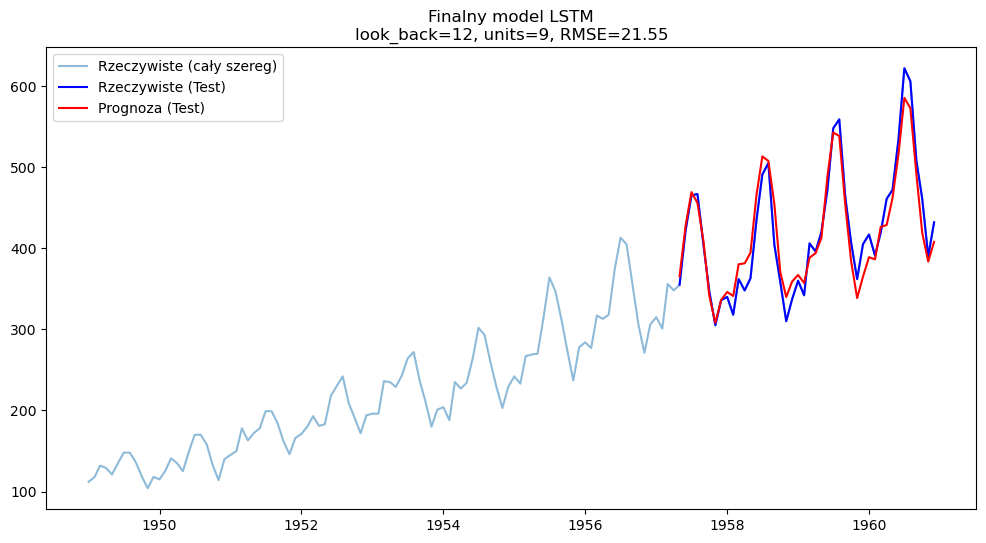

In [15]:
# Wizualizacja wyników
test_size = len(y_test_unscaled)
dates_test = dataset.index[-test_size:]

test_series_true = pd.Series(y_test_unscaled.flatten(), index=dates_test)
test_series_pred = pd.Series(y_test_pred_unscaled.flatten(), index=dates_test)

plt.figure(figsize=(12,6))
plt.plot(dataset.index, dataset['Passengers'], label='Rzeczywiste (cały szereg)', alpha=0.5)
plt.plot(test_series_true.index, test_series_true, label='Rzeczywiste (Test)', color='blue')
plt.plot(test_series_pred.index, test_series_pred, label='Prognoza (Test)', color='red')
plt.title(f"Finalny model LSTM\nlook_back={look_back}, units={units}, RMSE={rmse_test:.2f}")
plt.legend()
plt.show()

W tym module wykorzystano Min Max Scaler, jednak jak było widać na wykresach nie doszacowano prognozy. Teraz czas aby to zmienić. W pierwszym kroku zlogarytmuj wartości z datasetu (Podpowiedź: skorzystaj z np.log(dataset….). Dzięki temu zabiegowi amplituda nie będzie wzrastać z czasem. Następnie chcemy wystandaryzować zbiór, jednak zanim obliczymy stosunek obecnej wartości do wartości sprzed roku (Podpowiedź: dataset/dataset.shift(12)). Następnie już możesz skorzystać z StandardScaler.

Pamiętaj o tym, żeby podczas wizualizacji ‘cofnąć’ prognozę do wartości rzeczywistych i na tych wartościach wykonaj obliczenie RMSE.

In [3]:
dataset['log_passengers'] = np.log(dataset['Passengers'])

In [4]:
dataset['ratio'] = dataset['log_passengers'] / dataset['log_passengers'].shift(12)

In [5]:
df_transformed = dataset.dropna(subset=['ratio']).copy()

In [6]:
scaler = StandardScaler()
df_transformed['ratio_scaled'] = scaler.fit_transform(df_transformed[['ratio']])

In [7]:
def create_final_data_log_sequences(series, look_back=1):
    X, y = [], []
    for i in range(len(series) - look_back):
        X.append(series[i : i + look_back])
        y.append(series[i + look_back])
    return np.array(X), np.array(y)

In [8]:
def prepare_final_data_log_ratio(df_transformed, look_back=12):
    """
    1) Bierzemy df_transformed['ratio_scaled'] jako nasz sygnał.
    2) Dzielimy: 70% -> train_val, 30% -> test.
    3) Tworzymy sekwencje dla train_val i test.
    4) Zwracamy X_train, y_train, X_test, y_test, plus obiekt scaler.
       (Scaler do ratio mamy już wczytany, ewentualnie można go przekazać)
    """

    series = df_transformed['ratio_scaled'].values

    # Podział: 70% train_val, 30% test
    train_val_size = int(len(series) * 0.7)
    train_val_data = series[:train_val_size]
    test_data = series[train_val_size - look_back:]  # overlap, by nie ucinać sekwencji

    # Tworzymy sekwencje
    X_train_val, y_train_val = create_final_data_log_sequences(train_val_data, look_back=look_back)
    X_test_full, y_test_full = create_final_data_log_sequences(test_data, look_back=look_back)

    # Obcinamy ewentualne nadmiarowe próbki w test
    test_size = len(series) - train_val_size
    excess = len(y_test_full) - test_size
    if excess > 0:
        X_test_full = X_test_full[excess:]
        y_test_full = y_test_full[excess:]

    # Reshape do (N, 1, look_back)
    X_train_val = X_train_val.reshape(X_train_val.shape[0], 1, X_train_val.shape[1])
    X_test_full = X_test_full.reshape(X_test_full.shape[0], 1, X_test_full.shape[1])

    return (X_train_val, y_train_val), (X_test_full, y_test_full)

In [9]:
look_back = 12
(X_train_val, y_train_val), (X_test, y_test) = prepare_final_data_log_ratio(df_transformed, look_back=look_back)

print("Shapes:")
print(" X_train_val:", X_train_val.shape, " y_train_val:", y_train_val.shape)
print(" X_test     :", X_test.shape, "    y_test     :", y_test.shape)

# Budowa modelu (LSTM)
units = 9
model = Sequential()
model.add(LSTM(units, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

epochs = 200
batch_size = 1

model.fit(
    X_train_val, y_train_val,
    epochs=epochs,
    batch_size=batch_size,
    verbose=1)

Shapes:
 X_train_val: (80, 1, 12)  y_train_val: (80,)
 X_test     : (40, 1, 12)     y_test     : (40,)
Epoch 1/200
80/80 [==============================] - 2s 2ms/step - loss: 1.0263
Epoch 2/200
80/80 [==============================] - 0s 2ms/step - loss: 0.8845
Epoch 3/200
80/80 [==============================] - 0s 2ms/step - loss: 0.7772
Epoch 4/200
80/80 [==============================] - 0s 2ms/step - loss: 0.6976
Epoch 5/200
80/80 [==============================] - 0s 2ms/step - loss: 0.6346
Epoch 6/200
80/80 [==============================] - 0s 2ms/step - loss: 0.5853
Epoch 7/200
80/80 [==============================] - 0s 2ms/step - loss: 0.5420
Epoch 8/200
80/80 [==============================] - 0s 2ms/step - loss: 0.5064
Epoch 9/200
80/80 [==============================] - 0s 2ms/step - loss: 0.4758
Epoch 10/200
80/80 [==============================] - 0s 2ms/step - loss: 0.4478
Epoch 11/200
80/80 [==============================] - 0s 2ms/step - loss: 0.4202
Epoch 12/200
80

In [10]:
y_test_pred = model.predict(X_test)

# RMSE w skali ratio_scaled
rmse_scaled = root_mean_squared_error(y_test, y_test_pred)
print(f"RMSE w skali ratio_scaled: {rmse_scaled:.4f}")

2/2 [==============================] - 0s 5ms/step
RMSE w skali ratio_scaled: 0.8910


In [11]:
y_test_pred_unscaled = scaler.inverse_transform(y_test_pred)  # ratio
y_test_true_unscaled = scaler.inverse_transform(y_test.reshape(-1,1))  # ratio
rmse_ratio = root_mean_squared_error(y_test_true_unscaled, y_test_pred_unscaled)
print(f"RMSE w skali ratio (log[t]/log[t-12]): {rmse_ratio:.4f}")

RMSE w skali ratio (log[t]/log[t-12]): 0.0108


RMSE (liczba pasażerów) = 26.6070


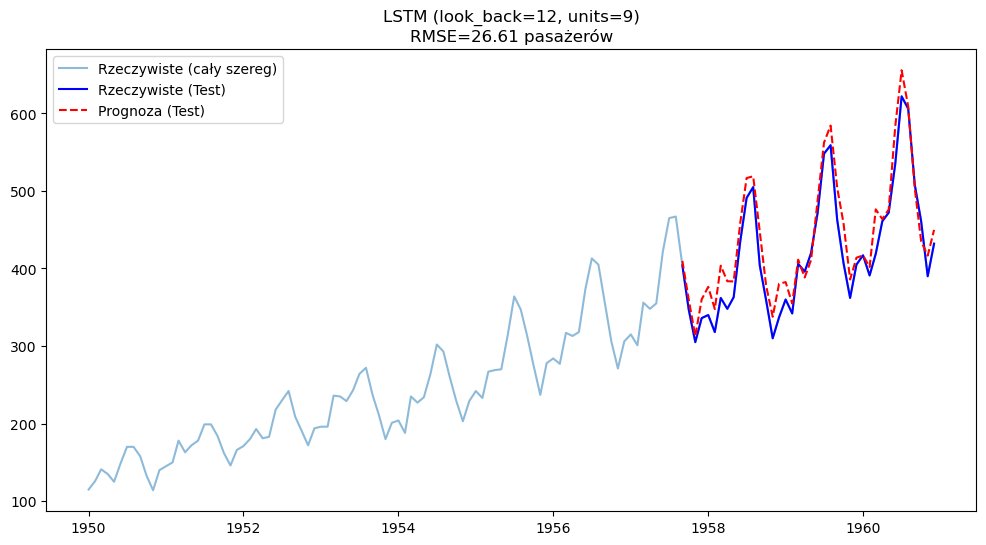

In [ ]:
y_test_pred_unscaled = scaler.inverse_transform(y_test_pred)          # (N, 1)
y_test_true_unscaled = scaler.inverse_transform(y_test.reshape(-1, 1))# (N, 1)

# Ustalenie rozmiarów podziału zbioru, tak jak w funkcji prepare_final_data_log_ratio
series_len = len(df_transformed['ratio_scaled'])
train_val_size = int(series_len * 0.7)
test_size = series_len - train_val_size

# Ustalenie, czy wystąpił 'excess' (nadmiar), tak samo jak w prepare_final_data_log_ratio
excess = len(y_test) - test_size

# Indeksy wierszy df_transformed, które odpowiadają próbom testowym (etykietom)
# Zgodnie z logiką: test_label_index zaczyna się od (train_val_size + excess)
start_test_label = train_val_size + excess
end_test_label = train_val_size + test_size
test_label_index = np.arange(start_test_label, end_test_label)

# W df_transformed przygotowujemy kolumnę na prognozę pasażerów w oryginalnej skali
df_transformed['pred_passengers'] = np.nan

# Dla każdej próbki testowej wyliczamy prognozowaną liczbę pasażerów
# Wzór: Pass_hat[t] = exp( ratio_hat[t] * ln(Passengers[t-12]) )
for i, idx in enumerate(test_label_index):
    # ratio_hat[t] w skali oryginalnej (log[t]/log[t-12]):
    ratio_pred = y_test_pred_unscaled[i, 0]
    
    # Rzeczywista liczba pasażerów 12 miesięcy wcześniej (w df_transformed)
    pass_12ago = df_transformed['Passengers'].iloc[idx - 12]
    
    # Wyliczamy Pass_hat[t]:
    pass_hat = np.exp(ratio_pred * np.log(pass_12ago))
    
    # Zapisujemy prognozę w df_transformed
    df_transformed.at[df_transformed.index[idx], 'pred_passengers'] = pass_hat

# Zbudujemy wektory z rzeczywistą i prognozowaną liczbą pasażerów w test:
test_real = df_transformed['Passengers'].iloc[test_label_index].values
test_pred = df_transformed['pred_passengers'].iloc[test_label_index].values

# Obliczamy RMSE w oryginalnej skali (liczba pasażerów)
rmse_real = root_mean_squared_error(test_real, test_pred)
print(f'RMSE (liczba pasażerów) = {rmse_real:.4f}')

plt.figure(figsize=(12, 6))
plt.plot(df_transformed.index, df_transformed['Passengers'], 
         label='Rzeczywiste (cały szereg)', alpha=0.5)
plt.plot(df_transformed.index[test_label_index], test_real, 
         label='Rzeczywiste (Test)', color='blue')
plt.plot(df_transformed.index[test_label_index], test_pred, 
         label='Prognoza (Test)', color='red', linestyle='--')
plt.title(f'LSTM (look_back={look_back}, units={units})\nRMSE={rmse_real:.2f} pasażerów')
plt.legend()
plt.show()

Wniosek końcowy: Model z użyciem danych przekształconych logarytmicznie osiągnął przeszacowane wyniki.
Model z użyciem skalowania MinMaxScaler osiągnął wyniki niedoszacowane.
Oba modele są bardzo proste w konstrukcji, co może wpływać na wyniki.
Model z danymi logarytmicznymi nie był również poddany testom poprzez 'GridSearch', użyto najlepszego modelu z MinMaxScaler.
Eksperyment pokazuje jak różne sposoby preparacji danych mogą mieć wpływ na wyniki. 